# Student Grades Prediction Project

# Project Description

The dataset contains grades scored by students throughout their university tenure in various courses and their CGPA calculated based on their grades

Columns Description-  total 43 columns.

-Seat No : The enrolled number of candidate that took the exams

CGPA : The cumulative GPA based on the four year total grade progress of each candidate . CGPA is a Final Marks -- provided to student.
 
· All other columns are course codes in the format AB-XXX where AB are alphabets representing candidates' departments and XXX are numbers where first X represents the year the canditate took exam

 
Predict - CGPA of a student based on different grades in four years.



# Importing Libraries

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
import warnings
warnings.filterwarnings('ignore')

# Importing Dataset

In [3]:
df=pd.read_csv('Student_grades.csv')
df

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,CS-97001,B-,D+,C-,C,C-,D+,D,C-,B-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,CS-97002,A,D,D+,D,B-,C,D,A,D+,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,CS-97003,A,B,A,B-,B+,A,B-,B+,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,CS-97004,D,C+,D+,D,D,A-,D+,C-,D,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,CS-97005,A-,A-,A-,B+,A,A,A-,B+,A,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,CS-97567,B,A,A,A-,A+,A,A-,A-,A+,...,A-,A-,A,A,A,B+,B+,B,A,3.798
567,CS-97568,A+,A,A,A,A,A,A,A-,A,...,B+,B+,A,A,A-,B,A-,C,A-,3.772
568,CS-97569,B,A,A-,B+,A,A,A,A,A,...,A-,B,A,B+,A,C,B+,A-,A-,3.470
569,CS-97570,A,B+,D,A,D,D+,B-,C-,B-,...,D,B,B,C-,D,C,B,B-,C,2.193


Here we downloaded the entire dataset on my local computer from https://github.com/dsrscientist/dataset4/blob/main/Grades.csv and then imported to jupiter notebook

In [4]:
df.head()

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,CS-97001,B-,D+,C-,C,C-,D+,D,C-,B-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,CS-97002,A,D,D+,D,B-,C,D,A,D+,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,CS-97003,A,B,A,B-,B+,A,B-,B+,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,CS-97004,D,C+,D+,D,D,A-,D+,C-,D,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,CS-97005,A-,A-,A-,B+,A,A,A-,B+,A,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448


In [5]:
df.tail()

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
566,CS-97567,B,A,A,A-,A+,A,A-,A-,A+,...,A-,A-,A,A,A,B+,B+,B,A,3.798
567,CS-97568,A+,A,A,A,A,A,A,A-,A,...,B+,B+,A,A,A-,B,A-,C,A-,3.772
568,CS-97569,B,A,A-,B+,A,A,A,A,A,...,A-,B,A,B+,A,C,B+,A-,A-,3.470
569,CS-97570,A,B+,D,A,D,D+,B-,C-,B-,...,D,B,B,C-,D,C,B,B-,C,2.193
570,CS-97571,C,D,D,C,C,D+,B,C+,C,...,C+,C,B-,D,F,C-,B+,D,C-,1.753


In [6]:
df.shape

(571, 43)

**Removing unnessary data from the dataset**

In [7]:
df.drop('Seat No.', inplace=True, axis=1)
df

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,B-,D+,C-,C,C-,D+,D,C-,B-,C-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,A,D,D+,D,B-,C,D,A,D+,D,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,A,B,A,B-,B+,A,B-,B+,A-,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,D,C+,D+,D,D,A-,D+,C-,D,C+,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,A-,A-,A-,B+,A,A,A-,B+,A,A-,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,B,A,A,A-,A+,A,A-,A-,A+,B+,...,A-,A-,A,A,A,B+,B+,B,A,3.798
567,A+,A,A,A,A,A,A,A-,A,A,...,B+,B+,A,A,A-,B,A-,C,A-,3.772
568,B,A,A-,B+,A,A,A,A,A,B,...,A-,B,A,B+,A,C,B+,A-,A-,3.470
569,A,B+,D,A,D,D+,B-,C-,B-,C-,...,D,B,B,C-,D,C,B,B-,C,2.193


In [8]:
df.shape

(571, 42)

# Exploratory Data Analysis(EDA)

In [10]:
df.columns.to_list()

['PH-121',
 'HS-101',
 'CY-105',
 'HS-105/12',
 'MT-111',
 'CS-105',
 'CS-106',
 'EL-102',
 'EE-119',
 'ME-107',
 'CS-107',
 'HS-205/20',
 'MT-222',
 'EE-222',
 'MT-224',
 'CS-210',
 'CS-211',
 'CS-203',
 'CS-214',
 'EE-217',
 'CS-212',
 'CS-215',
 'MT-331',
 'EF-303',
 'HS-304',
 'CS-301',
 'CS-302',
 'TC-383',
 'MT-442',
 'EL-332',
 'CS-318',
 'CS-306',
 'CS-312',
 'CS-317',
 'CS-403',
 'CS-421',
 'CS-406',
 'CS-414',
 'CS-419',
 'CS-423',
 'CS-412',
 'CGPA']

Here we can observe the list of all the columns present in the dataset

In [11]:
#checking for the data types present in the columns
df.dtypes

PH-121        object
HS-101        object
CY-105        object
HS-105/12     object
MT-111        object
CS-105        object
CS-106        object
EL-102        object
EE-119        object
ME-107        object
CS-107        object
HS-205/20     object
MT-222        object
EE-222        object
MT-224        object
CS-210        object
CS-211        object
CS-203        object
CS-214        object
EE-217        object
CS-212        object
CS-215        object
MT-331        object
EF-303        object
HS-304        object
CS-301        object
CS-302        object
TC-383        object
MT-442        object
EL-332        object
CS-318        object
CS-306        object
CS-312        object
CS-317        object
CS-403        object
CS-421        object
CS-406        object
CS-414        object
CS-419        object
CS-423        object
CS-412        object
CGPA         float64
dtype: object

As we can see here that there are two types of data type present in the data set ['object', 'float64']

In [12]:
#for the general informaton of the dataset 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 571 entries, 0 to 570
Data columns (total 42 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   PH-121     571 non-null    object 
 1   HS-101     571 non-null    object 
 2   CY-105     570 non-null    object 
 3   HS-105/12  570 non-null    object 
 4   MT-111     569 non-null    object 
 5   CS-105     571 non-null    object 
 6   CS-106     569 non-null    object 
 7   EL-102     569 non-null    object 
 8   EE-119     569 non-null    object 
 9   ME-107     569 non-null    object 
 10  CS-107     569 non-null    object 
 11  HS-205/20  566 non-null    object 
 12  MT-222     566 non-null    object 
 13  EE-222     564 non-null    object 
 14  MT-224     564 non-null    object 
 15  CS-210     564 non-null    object 
 16  CS-211     566 non-null    object 
 17  CS-203     566 non-null    object 
 18  CS-214     565 non-null    object 
 19  EE-217     565 non-null    object 
 20  CS-212    

Here we can see the basic information about the dataset like types of dataset present in the column number of rows null values and memory occupied by the dataset. and here the prescence of null values are different for each column that means null values are present in the dataset

**Checking the Null Values in DataSet**

In [13]:
df.isnull().sum()

PH-121        0
HS-101        0
CY-105        1
HS-105/12     1
MT-111        2
CS-105        0
CS-106        2
EL-102        2
EE-119        2
ME-107        2
CS-107        2
HS-205/20     5
MT-222        5
EE-222        7
MT-224        7
CS-210        7
CS-211        5
CS-203        5
CS-214        6
EE-217        6
CS-212        6
CS-215        6
MT-331        9
EF-303       10
HS-304       10
CS-301       10
CS-302       10
TC-383       10
MT-442       10
EL-332        9
CS-318        9
CS-306        9
CS-312       10
CS-317       12
CS-403       12
CS-421       12
CS-406       85
CS-414       13
CS-419       13
CS-423       14
CS-412       79
CGPA          0
dtype: int64

we can see that there are null values present in the data set

In [14]:
df.isnull().sum().sum()

425

There are total 425 values missing in the dataset

**Checking for null values by visualizing heatmap**

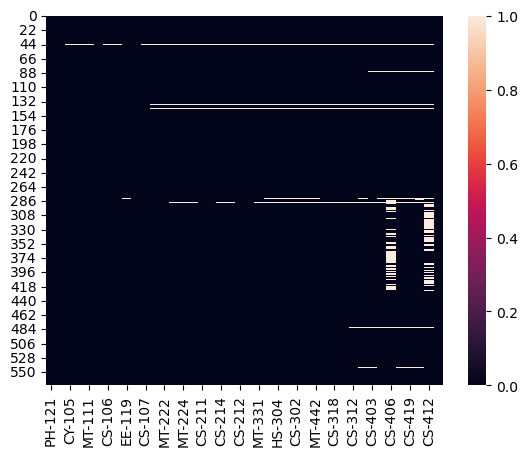

In [15]:

sns.heatmap(df.isnull())
plt.show()

The blank space present in the heatmap showing the presence of the null value in the dataset

# Treating null values:

In [16]:
null_col=[
'CY-105',        
'HS-105/12',     
'MT-111',               
'CS-106',        
'EL-102',        
'EE-119',        
'ME-107',        
'CS-107',        
'HS-205/20',    
'MT-222',       
'EE-222',        
'MT-224',        
'CS-210',        
'CS-211',        
'CS-203',        
'CS-214',       
'EE-217',        
'CS-212',       
'CS-215',       
'MT-331',       
'EF-303',       
'HS-304',       
'CS-301',       
'CS-302',       
'TC-383',
'MT-442',       
'EL-332',        
'CS-318',        
'CS-306',       
'CS-312',       
'CS-317',       
'CS-403',       
'CS-421',     
'CS-406',       
'CS-414',       
'CS-419' ,     
'CS-423',       
'CS-412']

In [17]:
for i in null_col:
    print(df[i].mode())
    print(df[i].mode()[0])
    df[i].fillna(df[i].mode()[0], inplace=True)

0    A
Name: CY-105, dtype: object
A
0    A
Name: HS-105/12, dtype: object
A
0    A-
Name: MT-111, dtype: object
A-
0    A-
Name: CS-106, dtype: object
A-
0    A-
Name: EL-102, dtype: object
A-
0    A-
Name: EE-119, dtype: object
A-
0    A-
Name: ME-107, dtype: object
A-
0    A
Name: CS-107, dtype: object
A
0    A-
Name: HS-205/20, dtype: object
A-
0    A-
Name: MT-222, dtype: object
A-
0    A
Name: EE-222, dtype: object
A
0    A-
Name: MT-224, dtype: object
A-
0    A-
Name: CS-210, dtype: object
A-
0    A-
Name: CS-211, dtype: object
A-
0    A-
Name: CS-203, dtype: object
A-
0    C
Name: CS-214, dtype: object
C
0    A-
Name: EE-217, dtype: object
A-
0    A-
Name: CS-212, dtype: object
A-
0    A-
Name: CS-215, dtype: object
A-
0    A
Name: MT-331, dtype: object
A
0    B
Name: EF-303, dtype: object
B
0    A-
Name: HS-304, dtype: object
A-
0    A-
Name: CS-301, dtype: object
A-
0    A-
Name: CS-302, dtype: object
A-
0    A
Name: TC-383, dtype: object
A
0    A-
Name: MT-442, dtype: object

Here we fill the Null values by using Mode method.

**Again checking for the null values:**


In [18]:
df.isnull().sum()

PH-121       0
HS-101       0
CY-105       0
HS-105/12    0
MT-111       0
CS-105       0
CS-106       0
EL-102       0
EE-119       0
ME-107       0
CS-107       0
HS-205/20    0
MT-222       0
EE-222       0
MT-224       0
CS-210       0
CS-211       0
CS-203       0
CS-214       0
EE-217       0
CS-212       0
CS-215       0
MT-331       0
EF-303       0
HS-304       0
CS-301       0
CS-302       0
TC-383       0
MT-442       0
EL-332       0
CS-318       0
CS-306       0
CS-312       0
CS-317       0
CS-403       0
CS-421       0
CS-406       0
CS-414       0
CS-419       0
CS-423       0
CS-412       0
CGPA         0
dtype: int64

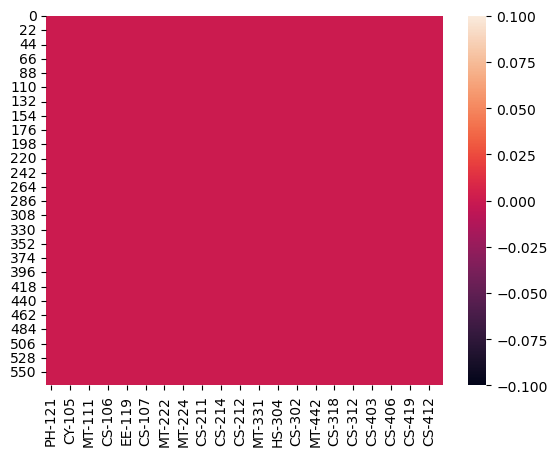

In [19]:
#Checking for null values by visualizing heatmap
sns.heatmap(df.isnull())
plt.show()

Here we can se that now there is no null value present in the dataset.

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 571 entries, 0 to 570
Data columns (total 42 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   PH-121     571 non-null    object 
 1   HS-101     571 non-null    object 
 2   CY-105     571 non-null    object 
 3   HS-105/12  571 non-null    object 
 4   MT-111     571 non-null    object 
 5   CS-105     571 non-null    object 
 6   CS-106     571 non-null    object 
 7   EL-102     571 non-null    object 
 8   EE-119     571 non-null    object 
 9   ME-107     571 non-null    object 
 10  CS-107     571 non-null    object 
 11  HS-205/20  571 non-null    object 
 12  MT-222     571 non-null    object 
 13  EE-222     571 non-null    object 
 14  MT-224     571 non-null    object 
 15  CS-210     571 non-null    object 
 16  CS-211     571 non-null    object 
 17  CS-203     571 non-null    object 
 18  CS-214     571 non-null    object 
 19  EE-217     571 non-null    object 
 20  CS-212    

As we can see here Non-Null Count for each column is same it means that there is no null value present in the dataset.

**Checking for the number of unique values present in the dataset:**

In [22]:
df['CGPA'].nunique()

491

We can see that out of 571 values 491 are unique values.

# Data Visualization

**Univariate Analysis:**

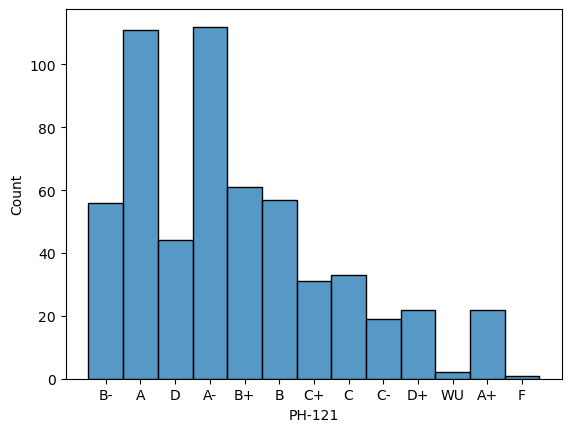

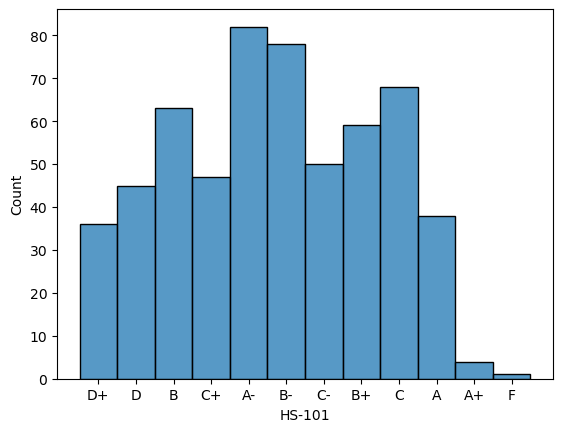

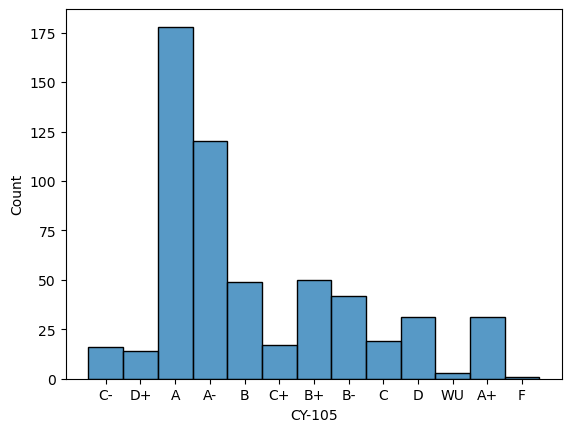

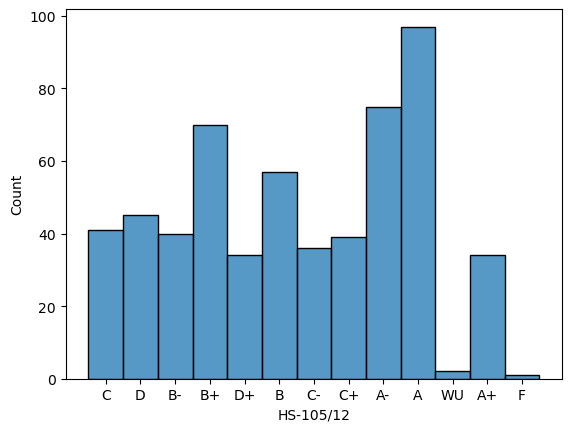

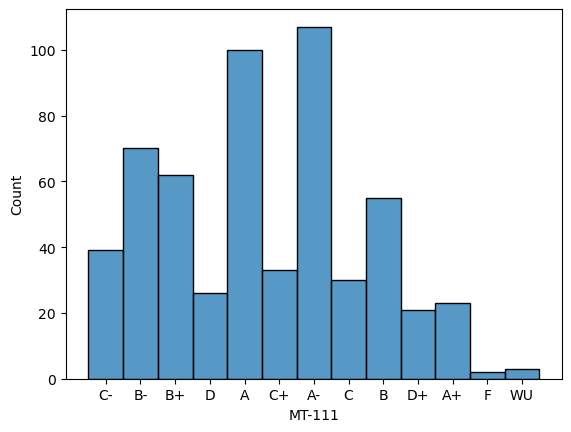

...

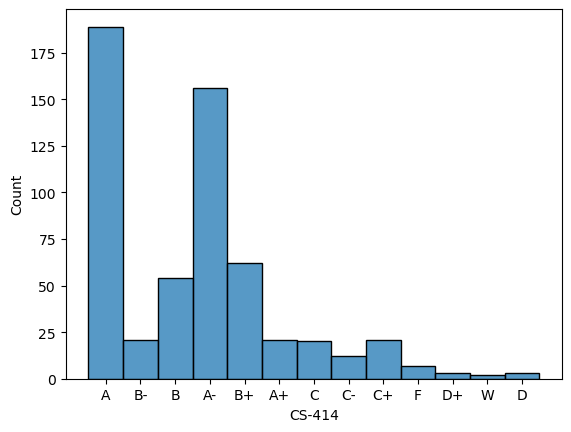

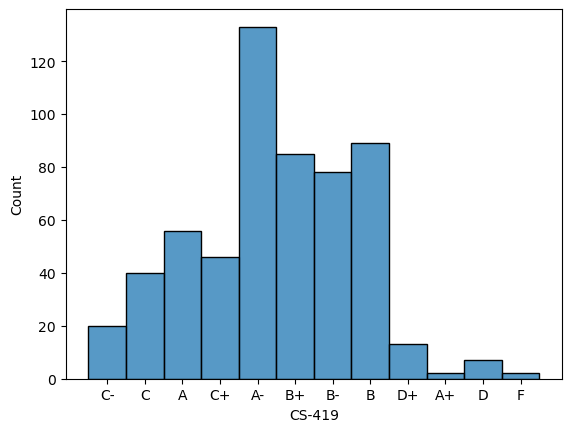

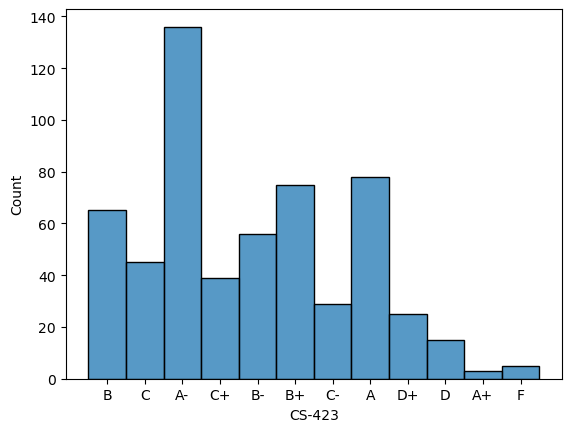

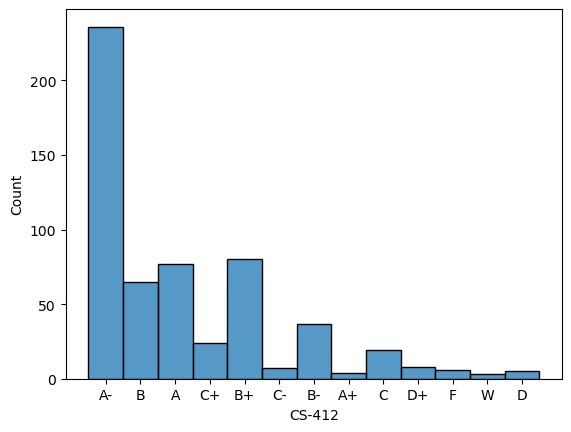

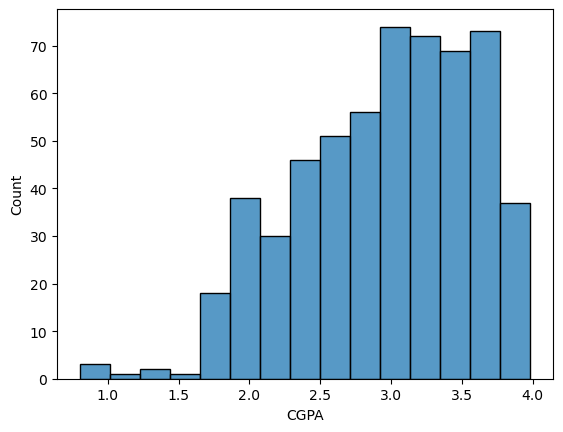

In [23]:
for i in df.columns:
    sns.histplot(df[i])
    plt.show()

**Bivarient Analysis:**

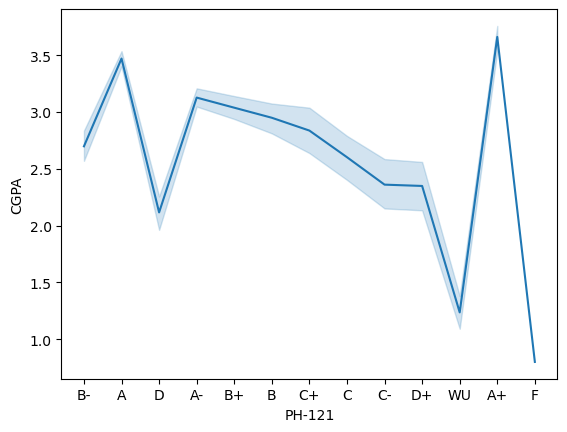

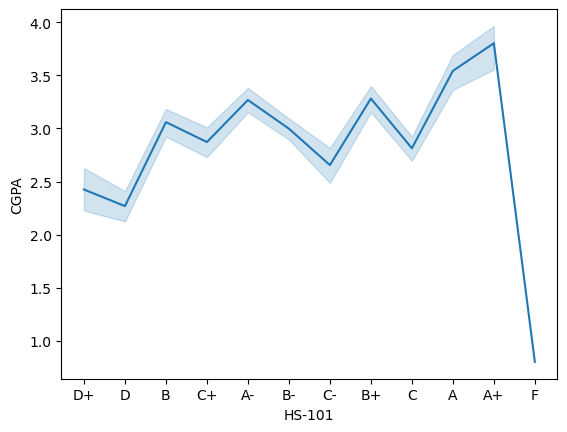

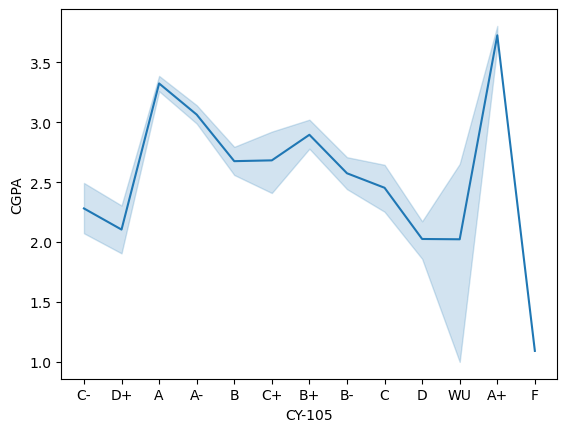

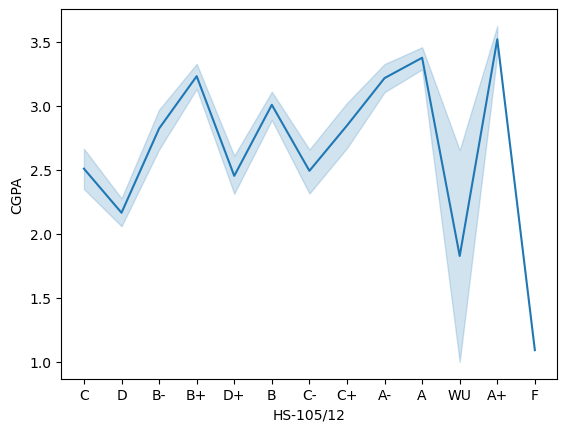

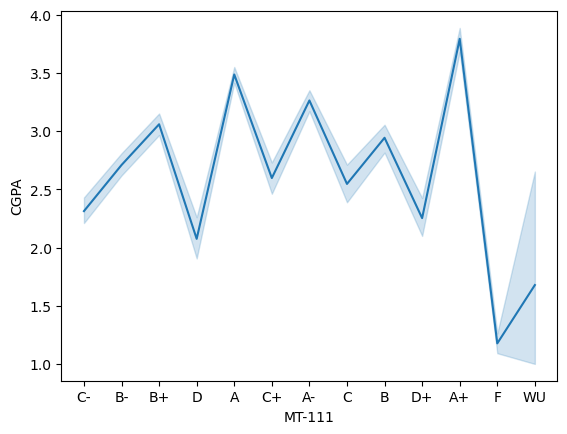

...

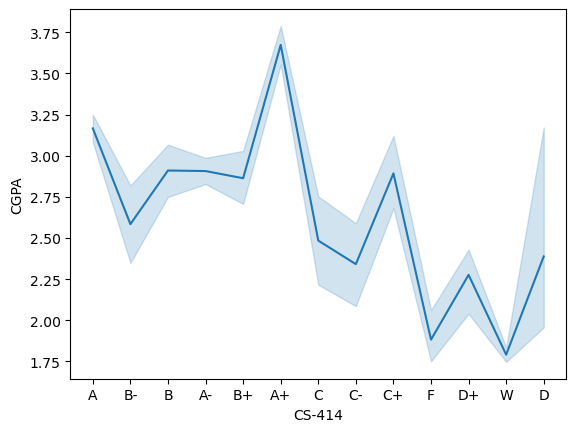

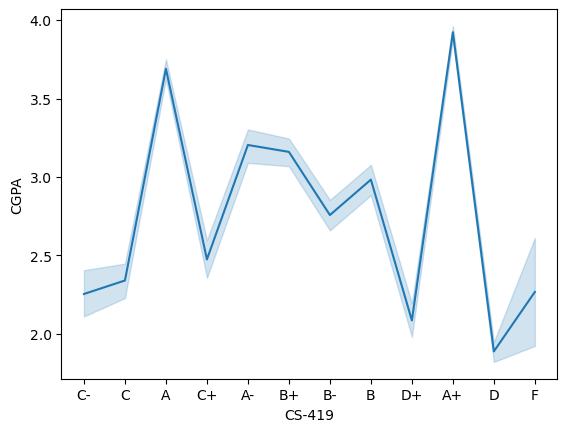

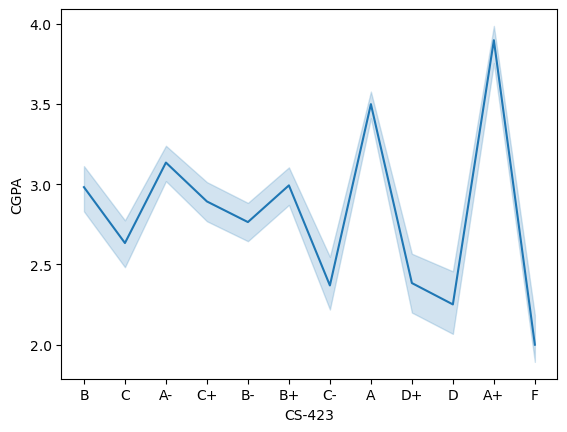

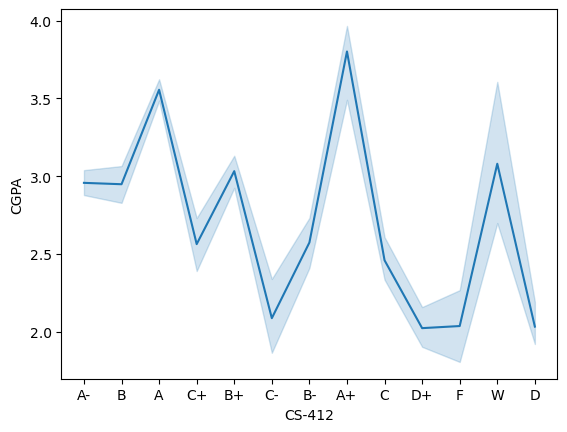

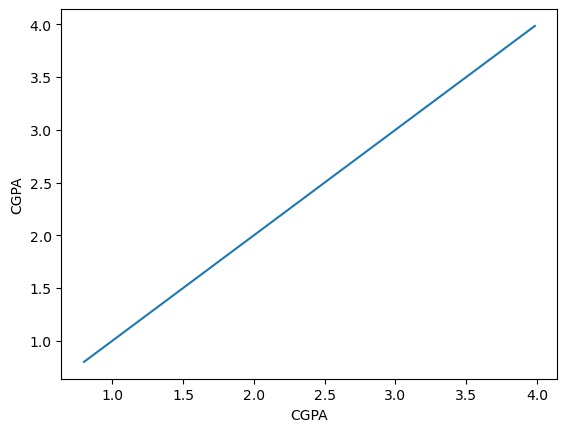

In [24]:
for i in df.columns:
    sns.lineplot(x=i, y='CGPA', data=df, palette='bright')
    plt.show()

**Encoding categorical columns using label Encoder:**

In [25]:
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()
for i in df.columns:
    if df[i].dtypes=='object':
        df[i]=LE.fit_transform(df[i].values.reshape(-1,1))
        
df

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,5,10,8,6,8,10,9,8,5,8,...,8,8,8,8,2,0,8,3,2,2.205
1,0,9,10,9,5,6,9,0,10,9,...,10,9,6,9,2,5,6,6,3,2.008
2,0,3,0,5,4,0,5,4,2,2,...,3,3,0,6,0,0,0,2,0,3.608
3,9,7,10,9,9,2,10,8,9,7,...,10,6,10,8,5,3,7,7,7,1.906
4,2,2,2,4,0,0,2,4,0,2,...,5,4,4,5,2,0,2,2,0,3.448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,3,0,0,2,1,0,2,2,1,4,...,2,2,0,0,0,4,4,3,0,3.798
567,1,0,0,0,0,0,0,2,0,0,...,4,4,0,0,2,3,2,6,2,3.772
568,3,0,2,4,0,0,0,0,0,3,...,2,3,0,4,0,6,4,2,2,3.470
569,0,4,9,0,9,10,5,8,5,8,...,9,3,3,8,9,6,3,5,6,2.193


**Multivarient Analysis:**

In [26]:
plot=plt.figure(figsize=(15,20))
sns.pairplot(df)
plt.show()

<Figure size 1500x2000 with 0 Axes>

In [27]:
#statistical summary  
df.describe()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
count,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,...,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000,571.000000
mean,3.781086,5.071804,2.898424,4.241681,3.896673,2.838879,4.122592,3.959720,3.886165,4.779335,...,4.071804,4.835377,3.432574,5.385289,2.984238,2.397548,3.856392,3.966725,3.049037,2.954888
std,3.046895,2.785317,2.964737,3.200507,2.988546,2.696709,2.727192,3.031436,2.657528,3.146202,...,3.362345,2.740382,2.980685,2.729063,2.468346,2.499388,2.382769,2.795475,2.332316,0.620552
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.800000
25%,2.000000,3.000000,0.000000,2.000000,2.000000,0.000000,2.000000,2.000000,2.000000,2.000000,...,1.000000,3.000000,0.000000,3.000000,2.000000,0.000000,2.000000,2.000000,2.000000,2.538000
50%,3.000000,5.000000,2.000000,4.000000,4.000000,2.000000,4.000000,3.000000,3.000000,5.000000,...,3.000000,5.000000,3.000000,5.000000,2.000000,2.000000,4.000000,4.000000,2.000000,3.029000
75%,6.000000,7.000000,4.500000,7.000000,6.000000,4.000000,5.000000,6.000000,6.000000,8.000000,...,7.000000,7.000000,5.000000,7.000000,4.000000,4.000000,5.000000,6.000000,4.000000,3.451000
max,12.000000,11.000000,12.000000,12.000000,12.000000,10.000000,12.000000,12.000000,11.000000,12.000000,...,13.000000,11.000000,10.000000,12.000000,13.000000,12.000000,11.000000,11.000000,12.000000,3.985000


After encoding the categorical columns we can see all columns details here. The counts of all the columns are same that means no null values in the dataset. This describe method describe the count,mean,std.,IQR and max values of all the columns.

# Correlation between target variable and independent variables

In [28]:
#checking the correlation
cor=df.corr()
cor

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
PH-121,1.000000,0.382436,0.557843,0.498561,0.468968,0.609990,0.293963,0.423942,0.579964,0.533558,...,0.038184,0.464022,0.321264,0.290351,0.280166,0.152437,0.462770,0.094921,0.293815,-0.663135
HS-101,0.382436,1.000000,0.335074,0.473132,0.432742,0.400713,0.312019,0.349412,0.309697,0.336545,...,0.213380,0.364250,0.229546,0.301934,0.265551,0.225977,0.284668,0.228103,0.226039,-0.537170
CY-105,0.557843,0.335074,1.000000,0.510123,0.538380,0.578573,0.378223,0.447539,0.467250,0.464418,...,0.261555,0.472137,0.464575,0.349827,0.129957,0.008774,0.430053,0.120885,0.064912,-0.658282
HS-105/12,0.498561,0.473132,0.510123,1.000000,0.494731,0.482406,0.499093,0.360304,0.400303,0.320137,...,0.263143,0.478816,0.451907,0.415946,0.168150,0.142806,0.465352,0.235029,0.153293,-0.613989
MT-111,0.468968,0.432742,0.538380,0.494731,1.000000,0.393684,0.500729,0.555895,0.409161,0.471685,...,0.467946,0.555098,0.410540,0.511463,0.300391,0.228637,0.502473,0.400679,0.269792,-0.730095
CS-105,0.609990,0.400713,0.578573,0.482406,0.393684,1.000000,0.286324,0.353949,0.507357,0.455470,...,0.059711,0.387639,0.279329,0.236345,0.237615,0.121965,0.306827,0.045134,0.179777,-0.613169
CS-106,0.293963,0.312019,0.378223,0.499093,0.500729,0.286324,1.000000,0.338645,0.269895,0.281233,...,0.450752,0.416562,0.426402,0.397195,0.129554,0.108916,0.421989,0.339963,0.185782,-0.534995
EL-102,0.423942,0.349412,0.447539,0.360304,0.555895,0.353949,0.338645,1.000000,0.448908,0.461690,...,0.301324,0.466556,0.304240,0.368959,0.253133,0.242234,0.379308,0.369173,0.265289,-0.642262
EE-119,0.579964,0.309697,0.467250,0.400303,0.409161,0.507357,0.269895,0.448908,1.000000,0.572964,...,0.156809,0.445496,0.341988,0.359230,0.297664,0.214165,0.465913,0.244615,0.320746,-0.646829
ME-107,0.533558,0.336545,0.464418,0.320137,0.471685,0.455470,0.281233,0.461690,0.572964,1.000000,...,0.199848,0.462568,0.336647,0.345832,0.300913,0.154184,0.440407,0.220977,0.293638,-0.663023



This gives the correlation between the dependent and independent variables. we cant visualize this by plotting heatmap

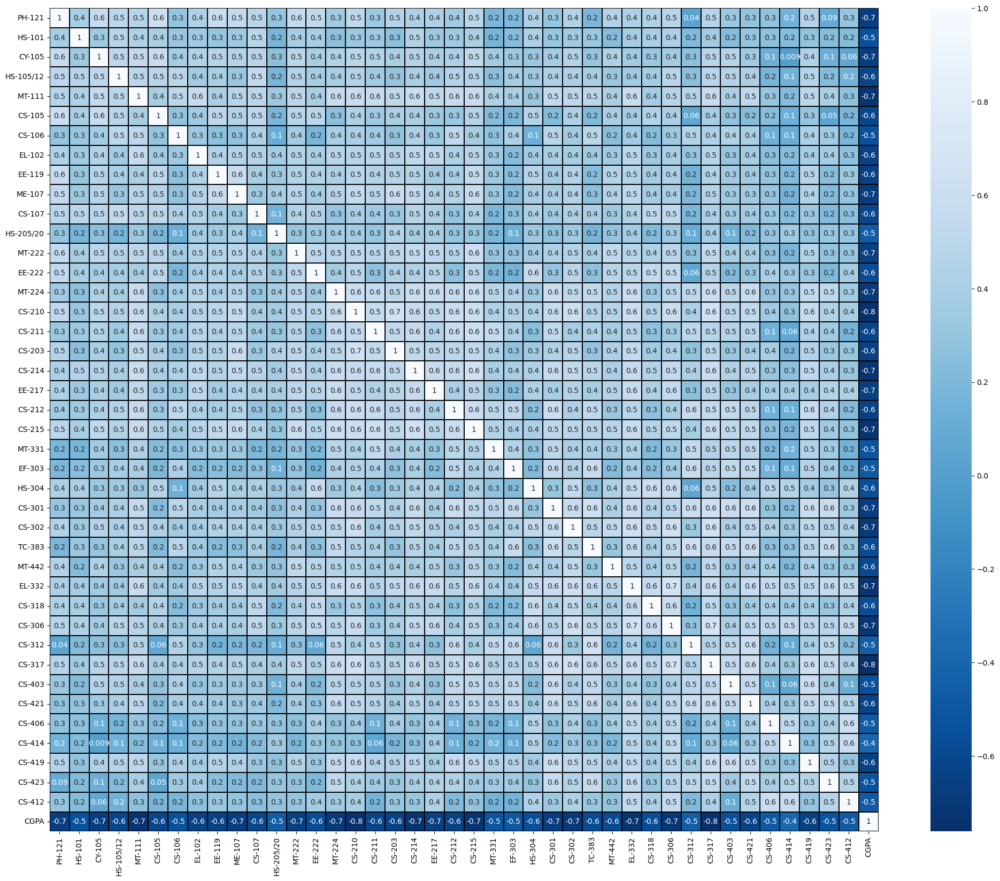

In [29]:
#visualizng the correlation matrix by plotting heatmap
plt.figure(figsize=(25,20))
sns.heatmap(df.corr(), linewidths=0.1, fmt='.1g', linecolor='black', annot=True, cmap='Blues_r')
plt.show()

In [30]:
cor['CGPA'].sort_values(ascending=False)

CGPA         1.000000
CS-414      -0.384003
CS-312      -0.458019
HS-205/20   -0.460525
CS-412      -0.466512
CS-406      -0.474419
EF-303      -0.485478
MT-331      -0.508428
CS-423      -0.520968
CS-106      -0.534995
HS-101      -0.537170
CS-403      -0.544543
HS-304      -0.557912
CS-318      -0.566393
TC-383      -0.572329
EE-222      -0.575335
MT-442      -0.582592
CS-105      -0.613169
HS-105/12   -0.613989
CS-107      -0.615309
CS-211      -0.628070
CS-421      -0.633001
CS-419      -0.641804
EL-102      -0.642262
CS-212      -0.642878
CS-203      -0.644191
EE-119      -0.646829
EE-217      -0.655993
MT-222      -0.656320
CY-105      -0.658282
ME-107      -0.663023
PH-121      -0.663135
CS-301      -0.664117
MT-224      -0.692696
CS-302      -0.696112
CS-306      -0.708299
EL-332      -0.729609
MT-111      -0.730095
CS-215      -0.730460
CS-214      -0.733848
CS-317      -0.760792
CS-210      -0.761468
Name: CGPA, dtype: float64

We can observe the positive and negative correlated features with the target

**Visualizing the correlation between label and features using bar plot:**

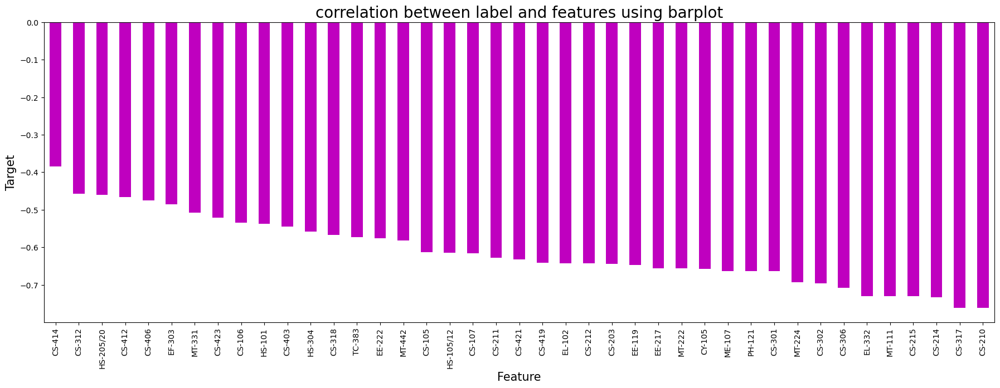

In [31]:
plt.figure(figsize=(22,7))
df.corr()['CGPA'].sort_values(ascending=False).drop(['CGPA']).plot(kind='bar',color='m')
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.title("correlation between label and features using barplot",fontsize=20)
plt.show()

# Separating Columns into Features and Target Label

In [32]:
x=df.iloc[:,0:-1]
y=df.iloc[:,-1]

In [33]:
x

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-306,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412
0,5,10,8,6,8,10,9,8,5,8,...,6,8,8,8,8,2,0,8,3,2
1,0,9,10,9,5,6,9,0,10,9,...,9,10,9,6,9,2,5,6,6,3
2,0,3,0,5,4,0,5,4,2,2,...,2,3,3,0,6,0,0,0,2,0
3,9,7,10,9,9,2,10,8,9,7,...,8,10,6,10,8,5,3,7,7,7
4,2,2,2,4,0,0,2,4,0,2,...,2,5,4,4,5,2,0,2,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,3,0,0,2,1,0,2,2,1,4,...,4,2,2,0,0,0,4,4,3,0
567,1,0,0,0,0,0,0,2,0,0,...,2,4,4,0,0,2,3,2,6,2
568,3,0,2,4,0,0,0,0,0,3,...,4,2,3,0,4,0,6,4,2,2
569,0,4,9,0,9,10,5,8,5,8,...,4,9,3,3,8,9,6,3,5,6


In [34]:
y

0      2.205
1      2.008
2      3.608
3      1.906
4      3.448
       ...  
566    3.798
567    3.772
568    3.470
569    2.193
570    1.753
Name: CGPA, Length: 571, dtype: float64

In [35]:
x.shape

(571, 41)

In [36]:
y.shape

(571,)

# Feature Scalling Using Standard Scalarization

In [37]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-306,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412
0,0.400402,1.770900,1.722261,0.549869,1.374222,2.657832,1.790004,1.333963,0.419492,1.024565,...,0.663660,1.169315,1.155824,1.533685,0.958939,-0.399094,-0.960095,1.740513,-0.346121,-0.450178
1,-1.242052,1.411559,2.397448,1.488043,0.369509,1.173242,1.790004,-1.307365,2.302589,1.342687,...,1.715324,1.764660,1.521056,0.862110,1.325686,-0.399094,1.042149,0.900418,0.727983,-0.021043
2,-1.242052,-0.744483,-0.978490,0.237145,0.034605,-1.053643,0.322008,0.013299,-0.710366,-0.884168,...,-0.738559,-0.319046,-0.670339,-1.152616,0.225444,-1.210063,-0.960095,-1.619869,-0.704156,-1.308446
3,1.714365,0.692879,2.397448,1.488043,1.709126,-0.311348,2.157003,1.333963,1.925970,0.706443,...,1.364769,1.764660,0.425358,2.205260,0.958939,0.817361,0.241251,1.320466,1.086017,1.695494
4,-0.585070,-1.103823,-0.303302,-0.075580,-1.305012,-1.053643,-0.778989,0.013299,-1.463605,-0.884168,...,-0.738559,0.276298,-0.305107,0.190534,-0.141304,-0.399094,-0.960095,-0.779774,-0.704156,-1.308446
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,-0.256579,-1.822504,-0.978490,-0.701029,-0.970108,-1.053643,-0.778989,-0.647033,-1.086986,-0.247924,...,-0.037450,-0.616719,-1.035572,-1.152616,-1.975041,-1.210063,0.641700,0.060322,-0.346121,-1.308446
567,-0.913561,-1.822504,-0.978490,-1.326478,-1.305012,-1.053643,-1.512987,-0.647033,-1.463605,-1.520412,...,-0.738559,-0.021374,-0.305107,-1.152616,-1.975041,-0.399094,0.241251,-0.779774,0.727983,-0.450178
568,-0.256579,-1.822504,-0.303302,-0.075580,-1.305012,-1.053643,-1.512987,-1.307365,-1.463605,-0.566046,...,-0.037450,-0.616719,-0.670339,-1.152616,-0.508051,-1.210063,1.442597,0.060322,-0.704156,-0.450178
569,-1.242052,-0.385142,2.059854,-1.326478,1.709126,2.657832,0.322008,1.333963,0.419492,1.024565,...,-0.037450,1.466987,-0.670339,-0.145253,0.958939,2.439300,1.442597,-0.359726,0.369948,1.266360


We have scaled the data using standard scalarization method to overcome the issue of biasness standard scaler will convert mean=0 and std=1

Now we check for the multicolinearity for this we use Variance Inflation factor(VIF) method

# Checking Variance Inflation factor(VIF)

In [38]:
#Finding varience inflation factor in each scaled column

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(x.values,i)
            for i in range(len(x.columns))]
vif['Features']=x.columns
vif

,VIF Values,Features
0,2.827608,PH-121
1,1.771294,HS-101
2,2.514966,CY-105
3,2.293035,HS-105/12
4,2.638921,MT-111
5,2.366597,CS-105
6,1.927701,CS-106
7,1.968027,EL-102
8,2.190768,EE-119
9,2.294552,ME-107


Here we can see that there is no multicolinearity present in the dataset so no need to remove the multicolinearity

# Checking Best Random State

In [55]:
maxR2_score=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.33, random_state=i)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    y_pred=lr.predict(x_test)
    R2=r2_score(y_test,y_pred)
    if R2>maxR2_score:
        maxR2_score=R2
        maxRS=i
print('Best accuracy is', maxR2_score ,'on Random_state', maxRS)

Best accuracy is 0.962934453988824 on Random_state 19


# Train Test Split

In [56]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2,  random_state=maxRS)

# Model Training & Testing

# Linear Regression

In [58]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score,mean_absolute_error
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesClassifier,ExtraTreesRegressor 
from xgboost import XGBRegressor

R2 Score: 0.968558792366067
MAE: 0.08912737748494746
Cross-Validation Scores: [0.93054663 0.90195303 0.80281133 0.94088191 0.84541904]
Mean Cross-Validation Score: 0.8843223877616344


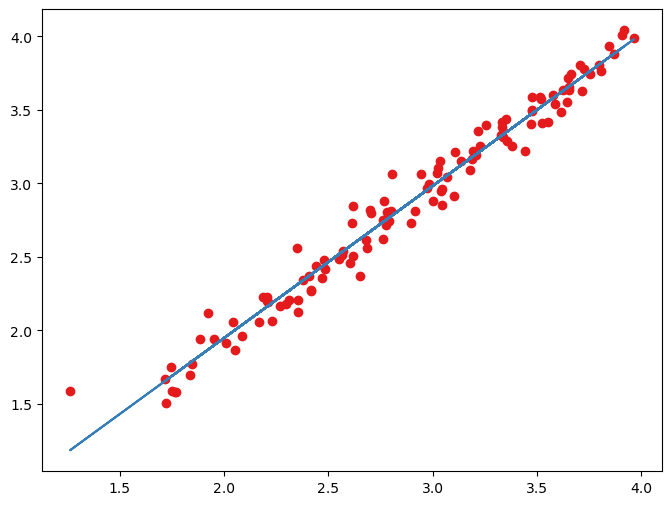

In [59]:
LR = LinearRegression()

# Perform cross-validation
cv_scores = cross_val_score(LR, x_train, y_train, cv=5, scoring='r2')

# Fit the model on the entire training set
LR.fit(x_train, y_train)

# Predict on the test set
y_pred = LR.predict(x_test)

# Print evaluation metrics
print('R2 Score:', r2_score(y_test, y_pred))
print('MAE:', mean_absolute_error(y_test, y_pred))

# Print cross-validation scores
print('Cross-Validation Scores:', cv_scores)
print('Mean Cross-Validation Score:', cv_scores.mean())

# Plot best fit line
plt.rcParams['figure.figsize'] = (8, 6)
palette = "Set1"
sns.set_palette(palette)

plt.plot(y_test, y_pred, 'o')
m, b = np.polyfit(y_test, y_pred, 1)
plt.plot(y_test, m * y_test + b)

plt.show()


In [76]:
LR.coef_

array([-0.06992365, -0.03874252, -0.06170082, -0.03088429, -0.03510917,
       -0.06643196, -0.03908466, -0.03157665, -0.03517152, -0.04547483,
       -0.0338394 , -0.03311135,  0.00394127,  0.0108582 , -0.02786202,
       -0.04481653, -0.00434337, -0.00689784, -0.04027451, -0.01926013,
       -0.00708438, -0.02868489, -0.02184137, -0.00428702,  0.01907742,
       -0.03399831, -0.01185605,  0.00499398, -0.01081454, -0.02140145,
        0.01612444, -0.01367259, -0.00678448, -0.05289547,  0.00688965,
       -0.01723735, -0.03142597, -0.03305053,  0.02100445, -0.04017132,
       -0.00964719])

In [77]:
LR.intercept_

2.9506118164582236

In [78]:
LR.score(x_train,y_train)  

0.9192676664670669

# Ridge Regression

In [60]:
# Define the parameter grid
param_grid = {'alpha': [0.1, 1, 10, 100]}  # Example parameter values, you can modify it

# Create the Ridge regression model
R = Ridge()

# Perform grid search with cross-validation
grid_search = GridSearchCV(R, param_grid, cv=5, scoring='r2')
grid_search.fit(x_train, y_train)

# Print the best parameters
print('Best Parameters:', grid_search.best_params_)

# Fit the model with the best parameters on the entire training set
best_R = grid_search.best_estimator_
best_R.fit(x_train, y_train)

# Predict on the test set
y_pred = best_R.predict(x_test)

# Print evaluation metrics
print('R2 Score:', r2_score(y_test, y_pred))
print('MAE:', mean_absolute_error(y_test, y_pred))

# Perform cross-validation with the best model
cv_scores = cross_val_score(best_R, x_train, y_train, cv=5, scoring='r2')

# Print cross-validation scores
print('Cross-Validation Scores:', cv_scores)
print('Mean Cross-Validation Score:', cv_scores.mean())

Best Parameters: {'alpha': 100}
R2 Score: 0.976684748752754
MAE: 0.07602265564668183
Cross-Validation Scores: [0.93900744 0.89974594 0.80467199 0.96192474 0.85576252]
Mean Cross-Validation Score: 0.892222526556228


# Lasso Regression

In [61]:
# Define the parameter grid
param_grid = {'alpha': [0.1, 1, 10, 100]}  # Example parameter values, you can modify it

# Create the Lasso regression model
L = Lasso()

# Perform grid search with cross-validation
grid_search = GridSearchCV(L, param_grid, cv=5, scoring='r2')
grid_search.fit(x_train, y_train)

# Print the best parameters
print('Best Parameters:', grid_search.best_params_)

# Fit the model with the best parameters on the entire training set
best_L = grid_search.best_estimator_
best_L.fit(x_train, y_train)

# Predict on the test set
y_pred = best_L.predict(x_test)


# Print evaluation metrics
print('R2 Score:', r2_score(y_test, y_pred))
print('MAE:', mean_absolute_error(y_test, y_pred))

# Perform cross-validation with the best model
cv_scores = cross_val_score(best_L, x_train, y_train, cv=5, scoring='r2')

# Print cross-validation scores
print('Cross-Validation Scores:', cv_scores)
print('Mean Cross-Validation Score:', cv_scores.mean())

Best Parameters: {'alpha': 0.1}
R2 Score: 0.893466175364926
MAE: 0.16215029352016105
Cross-Validation Scores: [0.84228672 0.81455663 0.73809236 0.89855886 0.78397102]
Mean Cross-Validation Score: 0.8154931163411847


# Decision Tree Regressor

In [62]:
# Define the parameter grid
param_grid = {
    'max_depth': [None, 5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2']
}

# Create the Decision Tree Regressor model
DTR = DecisionTreeRegressor()

# Perform grid search with cross-validation
grid_search = GridSearchCV(DTR, param_grid, cv=5, scoring='r2')
grid_search.fit(x_train, y_train)

# Print the best parameters
print('Best Parameters:', grid_search.best_params_)

# Fit the model with the best parameters on the entire training set
best_DTR = grid_search.best_estimator_
best_DTR.fit(x_train, y_train)

# Predict on the test set
y_pred = best_DTR.predict(x_test)

# Print evaluation metrics
print('R2 Score:', r2_score(y_test, y_pred))
print('MAE:', mean_absolute_error(y_test, y_pred))

# Perform cross-validation with the best model
cv_scores = cross_val_score(best_DTR, x_train, y_train, cv=5, scoring='r2')

# Print cross-validation scores
print('Cross-Validation Scores:', cv_scores)
print('Mean Cross-Validation Score:', cv_scores.mean())

Best Parameters: {'max_depth': 20, 'max_features': None, 'min_samples_leaf': 4, 'min_samples_split': 2}
R2 Score: 0.8240606277899944
MAE: 0.20858198757763977
Cross-Validation Scores: [0.90213223 0.808551   0.84355107 0.88033626 0.6181866 ]
Mean Cross-Validation Score: 0.810551429792947


# Random Forest Regressor

In [63]:
# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

# Create the Random Forest Regressor model
RFR = RandomForestRegressor()

# Perform grid search with cross-validation
grid_search = GridSearchCV(RFR, param_grid, cv=5, scoring='r2')
grid_search.fit(x_train, y_train)

# Print the best parameters
print('Best Parameters:', grid_search.best_params_)

# Fit the model with the best parameters on the entire training set
best_RFR = grid_search.best_estimator_
best_RFR.fit(x_train, y_train)

# Predict on the test set
y_pred = best_RFR.predict(x_test)

# Print evaluation metrics
print('R2 Score:', r2_score(y_test, y_pred))
print('MAE:', mean_absolute_error(y_test, y_pred))

# Perform cross-validation with the best model
cv_scores = cross_val_score(best_RFR, x_train, y_train, cv=5, scoring='r2')
# Print cross-validation scores
print('Cross-Validation Scores:', cv_scores)
print('Mean Cross-Validation Score:', cv_scores.mean())


Best Parameters: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}
R2 Score: 0.9448319686424789
MAE: 0.09975465389115722
Cross-Validation Scores: [0.94226633 0.93698348 0.84357913 0.96515073 0.87925847]
Mean Cross-Validation Score: 0.91344762576081


# Extra Tree Regressor

In [64]:
# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

# Create the Extra Trees Regressor model
ETR = ExtraTreesRegressor()

# Perform grid search with cross-validation
grid_search = GridSearchCV(ETR, param_grid, cv=5, scoring='r2')
grid_search.fit(x_train, y_train)

# Print the best parameters
print('Best Parameters:', grid_search.best_params_)

# Fit the model with the best parameters on the entire training set
best_ETR = grid_search.best_estimator_
best_ETR.fit(x_train, y_train)

# Predict on the test set
y_pred = best_ETR.predict(x_test)

# Print evaluation metrics
print('R2 Score:', r2_score(y_test, y_pred))
print('MAE:', mean_absolute_error(y_test, y_pred))

# Perform cross-validation with the best model
cv_scores = cross_val_score(best_ETR, x_train, y_train, cv=5, scoring='r2')

# Print cross-validation scores
print('Cross-Validation Scores:', cv_scores)
print('Mean Cross-Validation Score:', cv_scores.mean())

Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
R2 Score: 0.9414791524192528
MAE: 0.09827133333333289
Cross-Validation Scores: [0.94031986 0.94568112 0.85186922 0.96843275 0.9106868 ]
Mean Cross-Validation Score: 0.9233979470796179


# Ada Boost Regressor

In [65]:
# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

# Create the Gradient Boosting Regressor model
GBR = GradientBoostingRegressor()

# Perform grid search with cross-validation
grid_search = GridSearchCV(GBR, param_grid, cv=5, scoring='r2')
grid_search.fit(x_train, y_train)

# Print the best parameters
print('Best Parameters:', grid_search.best_params_)

# Fit the model with the best parameters on the entire training set
best_GBR = grid_search.best_estimator_
best_GBR.fit(x_train, y_train)

# Predict on the test set
y_pred = best_GBR.predict(x_test)

# Print evaluation metrics
print('R2 Score:', r2_score(y_test, y_pred))
print('MAE:', mean_absolute_error(y_test, y_pred))
# Perform cross-validation with the best model
cv_scores = cross_val_score(best_GBR, x_train, y_train, cv=5, scoring='r2')

# Print cross-validation scores
print('Cross-Validation Scores:', cv_scores)
print('Mean Cross-Validation Score:', cv_scores.mean())

Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 300}
R2 Score: 0.9638631936235417
MAE: 0.08246678625181425
Cross-Validation Scores: [0.96353399 0.96691647 0.84810352 0.97682021 0.88416703]
Mean Cross-Validation Score: 0.9279082412352218


# XGB Regressor

In [66]:
# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3, 5, 10],
    'min_child_weight': [1, 3, 5],
    'gamma': [0, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Create the XGBoost Regressor model
XGBR = XGBRegressor()

# Perform grid search with cross-validation
grid_search = GridSearchCV(XGBR, param_grid, cv=5, scoring='r2')
grid_search.fit(x_train, y_train)

# Print the best parameters
print('Best Parameters:', grid_search.best_params_)

# Fit the model with the best parameters on the entire training set
best_XGBR = grid_search.best_estimator_
best_XGBR.fit(x_train, y_train)

# Predict on the test set
y_pred = best_XGBR.predict(x_test)

# Print evaluation metrics
print('R2 Score:', r2_score(y_test, y_pred))
print('MAE:', mean_absolute_error(y_test, y_pred))

# Perform cross-validation with the best model
cv_scores = cross_val_score(best_XGBR, x_train, y_train, cv=5, scoring='r2')

# Print cross-validation scores
print('Cross-Validation Scores:', cv_scores)
print('Mean Cross-Validation Score:', cv_scores.mean())


Best Parameters: {'colsample_bytree': 1.0, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.8}
R2 Score: 0.9677917374155763
MAE: 0.0849810131404711
Cross-Validation Scores: [0.96808101 0.94824621 0.87664861 0.96648639 0.91897464]
Mean Cross-Validation Score: 0.93568737169782


By Observing all these models, accuracy of Linear Regression model is high so we will save the Linear Regression pkl file for further use.

# Saving model

In [70]:
import pickle
filename = 'LinearRegression.pkl'
pickle.dump(LR, open(filename, 'wb'))


In [71]:
pickle.dump(scaler, open('scaler.pkl','wb'))

In [72]:
with open('LinearRegression.pkl', 'rb') as file:
    data = pickle.load(file)

In [74]:
data.predict(x_test)

array([3.38125162, 2.19365237, 2.35403535, 1.959212  , 2.19644385,
       2.27271894, 2.12434356, 3.60220596, 3.80610349, 3.32749647,
       3.74402715, 3.49038997, 2.41968968, 3.10404878, 3.42028624,
       1.66599112, 2.56268875, 2.51106231, 3.2235154 , 1.58942485,
       2.43971058, 1.91428194, 1.94377113, 3.49843045, 2.33951725,
       2.62020904, 2.16756631, 2.73122803, 3.99189505, 2.268432  ,
       2.36982761, 2.12113409, 3.39777345, 2.2259054 , 2.56018077,
       3.58896489, 2.73028363, 2.37149178, 2.81011575, 3.41486198,
       3.71879402, 2.18054322, 2.61386983, 3.48414918, 1.75299855,
       3.21615391, 3.15413316, 3.74386942, 2.45745645, 2.95113107,
       2.81913861, 3.1685262 , 3.31693131, 3.41273243, 2.22510976,
       3.43574832, 2.8799126 , 3.25491456, 2.97181349, 1.69686049,
       3.58974314, 3.0428902 , 3.25555898, 3.55361229, 1.94388221,
       2.75131323, 2.84961889, 2.74602476, 3.80635388, 3.28902602,
       3.15407507, 3.87790105, 2.50471177, 4.01037295, 2.91092

# Comparing original values and predicted values

In [75]:
import numpy as np
a=np.array(y_test)
predict=np.array(lr.predict(x_test))
df_com=pd.DataFrame({'Original':a, 'Predicted':predict_test}, index=range(len(a)))
df_com

,Original,Predicted
0,3.332,2.343612
1,2.208,3.843071
2,2.468,3.755488
3,2.084,2.749071
4,2.206,2.725847
...,...,...
110,3.179,3.099072
111,3.723,3.934357
112,2.352,3.534751
113,3.806,3.182956


# Project Completed